# Preprocessing the Reddit Comments Dataset for Time Series Analysis

Supplementary notebook for Utkarsh and Soham's ASDS 5306 Course Project

In [1]:
import kagglehub
from spacy.lang.en import English
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import textstat

# kagglehub.login()

In [2]:
import matplotlib.font_manager as fm

path_to_public_sans = fm.findfont('Public Sans')
public_sans = fm.FontProperties(fname=path_to_public_sans)

sns.set_style("whitegrid")
plt.rcParams['font.family'] = public_sans.get_name()  # Register the font by its internal name
plt.rcParams['font.size'] = 12

# set figure size to 14, 6 in rcparams
plt.rcParams['figure.figsize'] = 14, 6
plt.rcParams['figure.dpi'] = 600
plt.rcParams['figure.facecolor'] = '#f7f6f2'
plt.rcParams['axes.facecolor'] = '#f7f6f2'
plt.rcParams['xtick.major.width'] = 0.5
plt.rcParams['ytick.major.width'] = 0.5
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.color'] = 'grey'
plt.rcParams['grid.alpha'] = 0.55
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.linewidth'] = 0.2
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=["#095859"])

# xtick text size
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

In [3]:
# initializing the English model for SpaCy
nlp = English()

In [4]:
# Download and init the latest version of the comments dataset
path = kagglehub.dataset_download("tushar5harma/topredditcomments")

In [5]:
top_posts = pd.read_csv(path + "/Top_Posts.csv")
top_posts.head()

,post_id,post_title,subreddit,post_url,flair_text,score,comments,upvote_ratio,date-time,year
0,gh1dj9,[Project] From books to presentations in 10s w...,MachineLearning,https://v.redd.it/v492uoheuxx41,Project,7798,186,0.99,2020-05-10 13:19:54,2020
1,kuc6tz,[D] A Demo from 1993 of 32-year-old Yann LeCun...,MachineLearning,https://v.redd.it/25nxi9ojfha61,Discussion,5851,133,0.98,2021-01-10 10:30:36,2021
2,g7nfvb,[R] First Order Motion Model applied to animat...,MachineLearning,https://v.redd.it/rlmmjm1q5wu41,Research,4761,111,0.97,2020-04-25 04:27:23,2020
3,lui92h,[N] AI can turn old photos into moving Images ...,MachineLearning,https://v.redd.it/ikd5gjlbi8k61,News,4688,230,0.97,2021-02-28 15:12:28,2021
4,ohxnts,[D] This AI reveals how much time politicians ...,MachineLearning,https://i.redd.it/34sgziebfia71.jpg,Discussion,4568,228,0.96,2021-07-11 04:18:59,2021


In [6]:
comments = pd.read_csv(path + "/Top_Posts_Comments.csv")
comments.head()

,post_id,comment
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...
1,gh1dj9,The future 🤯
2,gh1dj9,Simple yet very useful. Thank you for sharing ...
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i..."
4,gh1dj9,Ohh the nightmare of making this into a stable...


Sometimes comments on Reddit can be deleted, which reflects in the content as the string, `[deleted]`, and such rows must be deleted from our dataset

In [7]:
comments = comments.drop(comments[comments['comment'] == '[deleted]'].index)
comments.size

431260

Additionally, some comments in the dataset are null values, and we can drop such comments from consideration.

In [8]:
comments = comments.dropna(subset=['comment'])

In [9]:
comments.head()

,post_id,comment
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...
1,gh1dj9,The future 🤯
2,gh1dj9,Simple yet very useful. Thank you for sharing ...
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i..."
4,gh1dj9,Ohh the nightmare of making this into a stable...


Additionally, it might be a good idea to clean the Markdown formatting that Reddit allows, which may interfere with our analysis in the coming steps. To do so, we can use the `clean_markdown_ function as defined below:

In [10]:
import re

def clean_markdown(text):
    # Remove Markdown links [text](url)
    text = re.sub(r'\[([^\]]+)\]\([^)]+\)', r'\1', text)
    # Remove inline formatting like *italic*, **bold**, ***bold italic***
    text = re.sub(r'(\*+)(\w+?)\1', r'\2', text)
    # Remove strikethrough ~~text~~
    text = re.sub(r'~~(.*?)~~', r'\1', text)
    # Remove blockquotes > text
    text = re.sub(r'^>\s+', '', text, flags=re.MULTILINE)
    # Remove inline code `code` and code blocks ```code```
    text = re.sub(r'`([^`]*)`', r'\1', text)
    # Remove any remaining Markdown syntax (fallback)
    text = re.sub(r'[_*~`]', '', text)
    # Remove emails
    text = re.sub(r'\S+@\S+\.\S+', '', text)
    # Remove URLs
    text = re.sub(r'http\S+|www\.\S+', '', text)
    # replace `\n` with a full-stop and space
    text = text.replace('\n', '. ')
    return text

In [11]:
comments['cleaned_comment'] = comments['comment'].apply(clean_markdown)

In [12]:
comments.head()

,post_id,comment,cleaned_comment
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...,Twitter thread: . . Code: . . Background remov...
1,gh1dj9,The future 🤯,The future 🤯
2,gh1dj9,Simple yet very useful. Thank you for sharing ...,Simple yet very useful. Thank you for sharing ...
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i...","Almost guaranteed, Apple will copy your idea i..."
4,gh1dj9,Ohh the nightmare of making this into a stable...,Ohh the nightmare of making this into a stable...


Now that all null values and deleted comments are excluded, we can calculate comment lengths by number of words. 

In [13]:
comments['length'] = comments['comment'].str.split(' ').apply(len)
comments.head()

,post_id,comment,cleaned_comment,length
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...,Twitter thread: . . Code: . . Background remov...,35
1,gh1dj9,The future 🤯,The future 🤯,3
2,gh1dj9,Simple yet very useful. Thank you for sharing ...,Simple yet very useful. Thank you for sharing ...,10
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i...","Almost guaranteed, Apple will copy your idea i...",11
4,gh1dj9,Ohh the nightmare of making this into a stable...,Ohh the nightmare of making this into a stable...,19


In [14]:
comments.describe()

,length
count,215614.000000
mean,46.168811
std,68.636365
min,1.000000
25%,10.000000
50%,25.000000
75%,55.000000
max,2208.000000


Now, let's consider another metric like the Type-Token Ratio, which is the ratio of _unique_ to _total_ words in some text. Higher TTR's may be indicative of richer, more diverse language that in turn signals more complex thought processes.

In [15]:
def type_token_ratio(text):
    # using the spacy tokenizer here may be helpful to obtain more accurate TTR's
    doc = nlp(text)
    tokens = [token.text for token in doc]
    if len(tokens) == 0:
        return 0
    return len(set(tokens)) / len(tokens)

In [16]:
comments['ttr'] = comments['comment'].apply(type_token_ratio)
comments.head()

,post_id,comment,cleaned_comment,length,ttr
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...,Twitter thread: . . Code: . . Background remov...,35,0.758065
1,gh1dj9,The future 🤯,The future 🤯,3,1.000000
2,gh1dj9,Simple yet very useful. Thank you for sharing ...,Simple yet very useful. Thank you for sharing ...,10,0.916667
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i...","Almost guaranteed, Apple will copy your idea i...",11,0.866667
4,gh1dj9,Ohh the nightmare of making this into a stable...,Ohh the nightmare of making this into a stable...,19,1.000000


The next metric we can consider for each comment is the Flesch-Kincaid Grade Level, a score that indicates the minimum grade level of education required to understand a given text. For reference, the U.S. Government uses a baseline of Grade 9 for most reference manuals and texts it produces.

In [17]:
def flesch_kincaid_grade_level(text):
    return textstat.flesch_kincaid_grade(text)

In [18]:
comments['fkgl'] = comments['comment'].apply(flesch_kincaid_grade_level)
comments.head()

,post_id,comment,cleaned_comment,length,ttr,fkgl
0,gh1dj9,Twitter thread: [https://twitter.com/cyrildiag...,Twitter thread: . . Code: . . Background remov...,35,0.758065,19.7
1,gh1dj9,The future 🤯,The future 🤯,3,1.000000,2.9
2,gh1dj9,Simple yet very useful. Thank you for sharing ...,Simple yet very useful. Thank you for sharing ...,10,0.916667,1.7
3,gh1dj9,"Almost guaranteed, Apple will copy your idea i...","Almost guaranteed, Apple will copy your idea i...",11,0.866667,5.2
4,gh1dj9,Ohh the nightmare of making this into a stable...,Ohh the nightmare of making this into a stable...,19,1.000000,3.5


In [19]:
# comments longer than 150 words
long_comments = comments[(comments['length'].isin(range(150, 1000))) & (comments['fkgl'] > 0)]
long_comments.describe()

,length,ttr,fkgl
count,11852.000000,11852.000000,11852.000000
mean,251.987681,0.559271,10.006969
std,119.986187,0.074717,4.650957
min,150.000000,0.019113,0.600000
25%,173.000000,0.517104,7.900000
50%,210.000000,0.569231,9.500000
75%,284.000000,0.612440,11.400000
max,996.000000,0.756098,173.700000


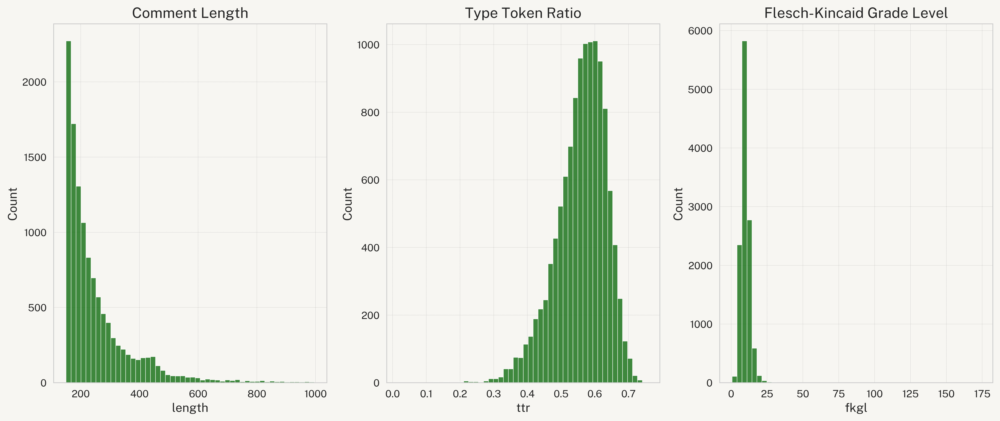

In [20]:
# plotting histograms for the length, TTR and FKGL

fig, axes = plt.subplots(1, 3)

sns.histplot(data=long_comments, x='length', bins=50, ax=axes[0], color='darkgreen')
axes[0].set_title('Comment Length')
sns.histplot(data=long_comments, x='ttr', bins=50, ax=axes[1], color='darkgreen')
axes[1].set_title('Type Token Ratio')
sns.histplot(data=long_comments, x='fkgl', bins=50, ax=axes[2], color='darkgreen')
axes[2].set_title('Flesch-Kincaid Grade Level')

plt.tight_layout()
plt.show() 

In preparation to merge comments into the posts dataframe, we need to aggregate metrics by each `post_id`. For example, let's consider the average.

In [21]:
# aggregate metrics for each post_id

post_metrics = long_comments.groupby('post_id').agg({ 'length': 'mean', 'ttr': 'mean', 'fkgl': 'mean' }).reset_index()
post_metrics.head()

,post_id,length,ttr,fkgl
0,1008i6v,186.000000,0.401961,11.800000
1,101t0vt,168.000000,0.585799,19.500000
2,1027spa,211.500000,0.556451,6.733333
3,1032pgs,398.090909,0.530987,10.018182
4,1033ecx,161.000000,0.524064,19.500000


In [22]:
# merge post_metrics with top_posts

top_posts = top_posts.merge(post_metrics, on='post_id')
top_posts.head()

,post_id,post_title,subreddit,post_url,flair_text,score,comments,upvote_ratio,date-time,year,length,ttr,fkgl
0,gh1dj9,[Project] From books to presentations in 10s w...,MachineLearning,https://v.redd.it/v492uoheuxx41,Project,7798,186,0.99,2020-05-10 13:19:54,2020,264.0,0.546962,12.433333
1,kuc6tz,[D] A Demo from 1993 of 32-year-old Yann LeCun...,MachineLearning,https://v.redd.it/25nxi9ojfha61,Discussion,5851,133,0.98,2021-01-10 10:30:36,2021,221.5,0.527130,9.100000
2,lui92h,[N] AI can turn old photos into moving Images ...,MachineLearning,https://v.redd.it/ikd5gjlbi8k61,News,4688,230,0.97,2021-02-28 15:12:28,2021,181.0,0.588785,9.200000
3,ohxnts,[D] This AI reveals how much time politicians ...,MachineLearning,https://i.redd.it/34sgziebfia71.jpg,Discussion,4568,228,0.96,2021-07-11 04:18:59,2021,250.0,0.581921,10.971429
4,n2f0ld,[D] Types of Machine Learning Papers,MachineLearning,https://i.redd.it/6z2s8h1iahw61.jpg,Discussion,4370,219,0.98,2021-05-01 09:32:20,2021,192.6,0.588889,7.740000


In [23]:
top_posts = top_posts.rename(columns={'length': 'avg_comment_length', 'ttr': 'avg_comment_ttr', 'fkgl': 'avg_comment_fkgl'})
top_posts.head()

,post_id,post_title,subreddit,post_url,flair_text,score,comments,upvote_ratio,date-time,year,avg_comment_length,avg_comment_ttr,avg_comment_fkgl
0,gh1dj9,[Project] From books to presentations in 10s w...,MachineLearning,https://v.redd.it/v492uoheuxx41,Project,7798,186,0.99,2020-05-10 13:19:54,2020,264.0,0.546962,12.433333
1,kuc6tz,[D] A Demo from 1993 of 32-year-old Yann LeCun...,MachineLearning,https://v.redd.it/25nxi9ojfha61,Discussion,5851,133,0.98,2021-01-10 10:30:36,2021,221.5,0.527130,9.100000
2,lui92h,[N] AI can turn old photos into moving Images ...,MachineLearning,https://v.redd.it/ikd5gjlbi8k61,News,4688,230,0.97,2021-02-28 15:12:28,2021,181.0,0.588785,9.200000
3,ohxnts,[D] This AI reveals how much time politicians ...,MachineLearning,https://i.redd.it/34sgziebfia71.jpg,Discussion,4568,228,0.96,2021-07-11 04:18:59,2021,250.0,0.581921,10.971429
4,n2f0ld,[D] Types of Machine Learning Papers,MachineLearning,https://i.redd.it/6z2s8h1iahw61.jpg,Discussion,4370,219,0.98,2021-05-01 09:32:20,2021,192.6,0.588889,7.740000


## Generating weekly Time Series data for each post's comment length, ttr and fkgl

In [24]:
top_posts['date-time'] = pd.to_datetime(top_posts['date-time'])
top_posts.info()
# top_posts.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1734 entries, 0 to 1733
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   post_id             1734 non-null   object        
 1   post_title          1734 non-null   object        
 2   subreddit           1734 non-null   object        
 3   post_url            1734 non-null   object        
 4   flair_text          1481 non-null   object        
 5   score               1734 non-null   int64         
 6   comments            1734 non-null   int64         
 7   upvote_ratio        1734 non-null   float64       
 8   date-time           1734 non-null   datetime64[ns]
 9   year                1734 non-null   int64         
 10  avg_comment_length  1734 non-null   float64       
 11  avg_comment_ttr     1734 non-null   float64       
 12  avg_comment_fkgl    1734 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(3), obje

In [25]:
top_posts['week'] = top_posts['date-time'].dt.isocalendar().week
top_posts.head()

,post_id,post_title,subreddit,post_url,flair_text,score,comments,upvote_ratio,date-time,year,avg_comment_length,avg_comment_ttr,avg_comment_fkgl,week
0,gh1dj9,[Project] From books to presentations in 10s w...,MachineLearning,https://v.redd.it/v492uoheuxx41,Project,7798,186,0.99,2020-05-10 13:19:54,2020,264.0,0.546962,12.433333,19
1,kuc6tz,[D] A Demo from 1993 of 32-year-old Yann LeCun...,MachineLearning,https://v.redd.it/25nxi9ojfha61,Discussion,5851,133,0.98,2021-01-10 10:30:36,2021,221.5,0.527130,9.100000,1
2,lui92h,[N] AI can turn old photos into moving Images ...,MachineLearning,https://v.redd.it/ikd5gjlbi8k61,News,4688,230,0.97,2021-02-28 15:12:28,2021,181.0,0.588785,9.200000,8
3,ohxnts,[D] This AI reveals how much time politicians ...,MachineLearning,https://i.redd.it/34sgziebfia71.jpg,Discussion,4568,228,0.96,2021-07-11 04:18:59,2021,250.0,0.581921,10.971429,27
4,n2f0ld,[D] Types of Machine Learning Papers,MachineLearning,https://i.redd.it/6z2s8h1iahw61.jpg,Discussion,4370,219,0.98,2021-05-01 09:32:20,2021,192.6,0.588889,7.740000,17


In [26]:
# drop post_title, post_url, subreddit, flair_text, score, upvote_ratio
top_posts = top_posts.drop(columns=['post_title', 'post_url', 'subreddit', 'flair_text', 'score', 'upvote_ratio'])
top_posts.head()

,post_id,comments,date-time,year,avg_comment_length,avg_comment_ttr,avg_comment_fkgl,week
0,gh1dj9,186,2020-05-10 13:19:54,2020,264.0,0.546962,12.433333,19
1,kuc6tz,133,2021-01-10 10:30:36,2021,221.5,0.527130,9.100000,1
2,lui92h,230,2021-02-28 15:12:28,2021,181.0,0.588785,9.200000,8
3,ohxnts,228,2021-07-11 04:18:59,2021,250.0,0.581921,10.971429,27
4,n2f0ld,219,2021-05-01 09:32:20,2021,192.6,0.588889,7.740000,17


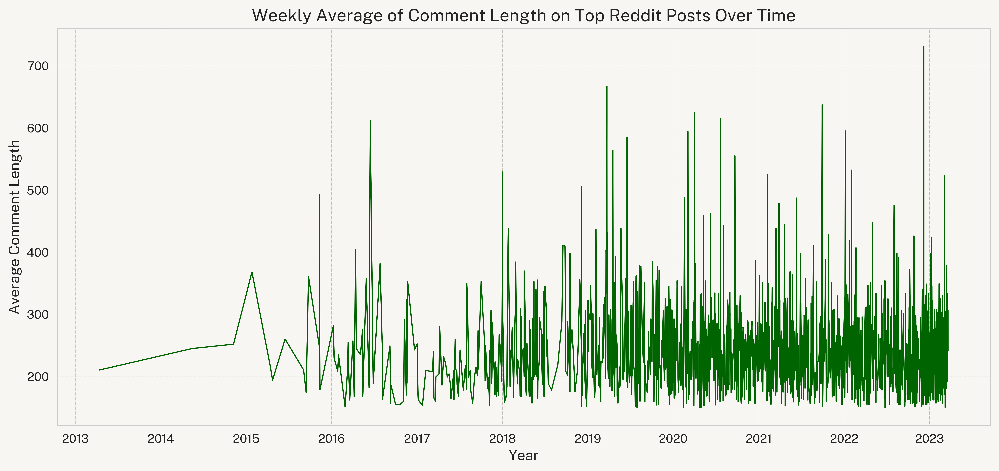

In [27]:
# plotting comment length over time, week by week
sns.lineplot(data=top_posts, x='date-time', y='avg_comment_length', color='darkgreen', linewidth=1)
plt.title('Weekly Average of Comment Length on Top Reddit Posts Over Time')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')

plt.show()

In [28]:
weekly_time_series = top_posts.groupby(['year', 'week']).agg({ 'avg_comment_length': 'mean', 'avg_comment_ttr': 'mean', 'avg_comment_fkgl': 'mean' }).reset_index()

In [29]:
# construct year-week timestamp using year and week columns
weekly_time_series['date-time'] = weekly_time_series['year'].astype(str) + '-W' + weekly_time_series['week'].astype(str) + '-1'
weekly_time_series['date-time'] = pd.to_datetime(weekly_time_series['date-time'], format='%G-W%V-%u')
weekly_time_series = weekly_time_series.set_index('date-time')

weekly_time_series.head()

,year,week,avg_comment_length,avg_comment_ttr,avg_comment_fkgl
date-time,,,,,
2013-04-08,2013,15,210.333333,0.567902,8.366667
2014-05-12,2014,20,244.852941,0.563459,9.964706
2014-11-03,2014,45,251.827586,0.570998,11.186207
2015-01-19,2015,4,368.000000,0.521757,9.540000
2015-04-13,2015,16,216.666667,0.575216,9.570370


### Trimming sparse data

In [30]:
# Keep data only from Jan 2015 to Dec 2022

weekly_time_series = weekly_time_series.loc['2016-01-01':'2022-12-31']

#### Exporting time series data to a CSV for modeling in R

In [31]:
weekly_time_series.to_csv('weekly_time_series.csv')

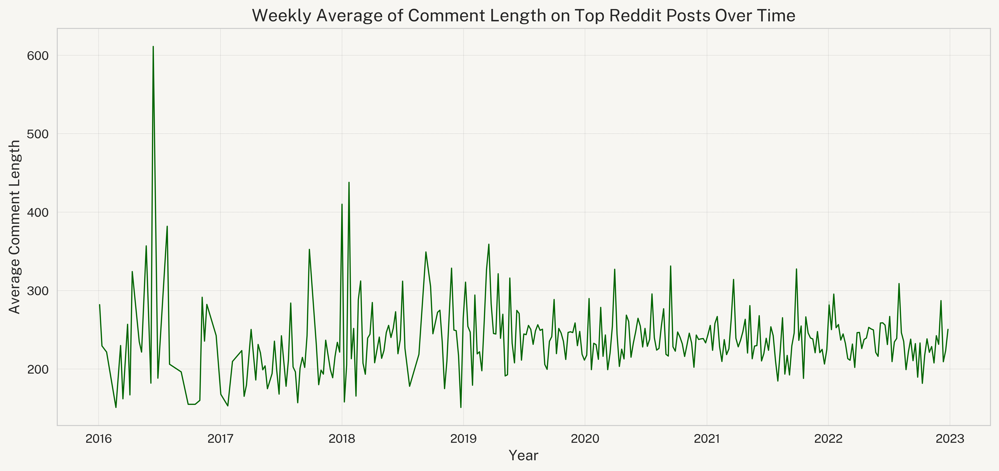

In [32]:
# plotting comment length over time, week by week
sns.lineplot(data=weekly_time_series, x='date-time', y='avg_comment_length', color='darkgreen', linewidth=1)
plt.title('Weekly Average of Comment Length on Top Reddit Posts Over Time')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')

plt.show()

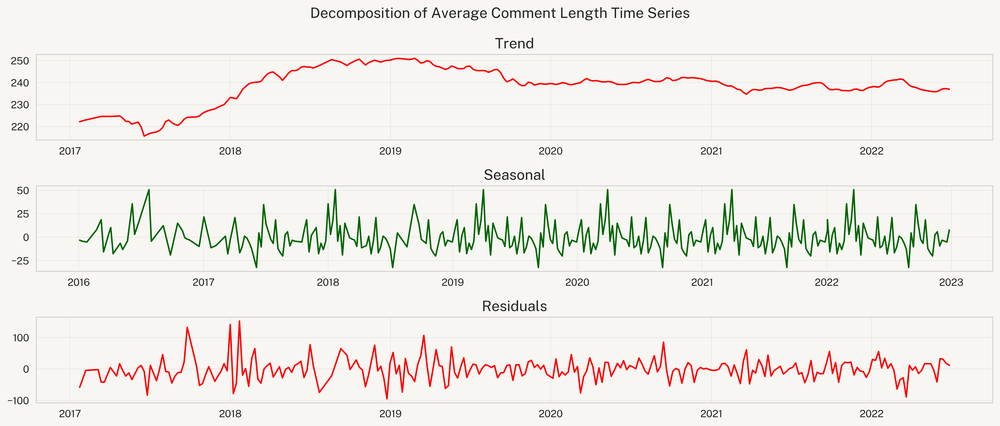

In [33]:
# decomposing weekly time series into trend, seasonality and residuals

from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(weekly_time_series['avg_comment_length'], model='additive', period=52)

fig, axes = plt.subplots(3, 1)
fig.suptitle('Decomposition of Average Comment Length Time Series')

axes[0].plot(decomposition.trend, color='red')
axes[0].set_title('Trend')
axes[1].plot(decomposition.seasonal, color='darkgreen')
axes[1].set_title('Seasonal')
axes[2].plot(decomposition.resid, color='red')
axes[2].set_title('Residuals')

plt.tight_layout()
plt.show()

### Removing any trends and seasonality

In [34]:
first_diff = weekly_time_series['avg_comment_length'].diff().dropna()

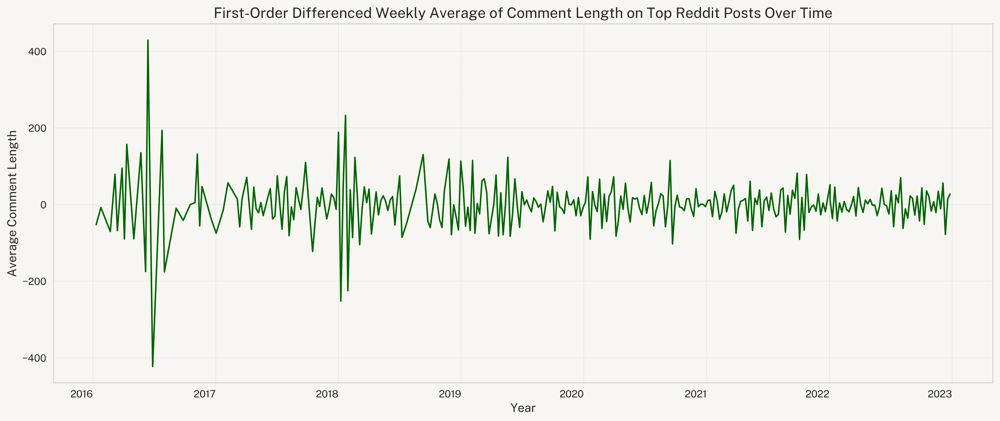

In [35]:
# plotting comment length over time, week by week
first_diff.plot(color='darkgreen')
plt.title('First-Order Differenced Weekly Average of Comment Length on Top Reddit Posts Over Time')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

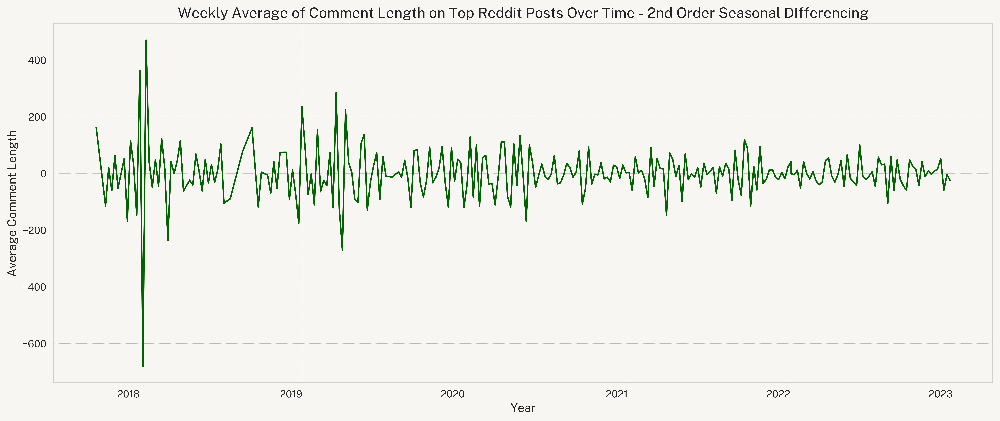

In [36]:
seasonal_diff = first_diff.diff(52).dropna()

# plotting comment length over time, week by week
seasonal_diff.plot(color='darkgreen')
plt.title('Weekly Average of Comment Length on Top Reddit Posts Over Time - 2nd Order Seasonal DIfferencing')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

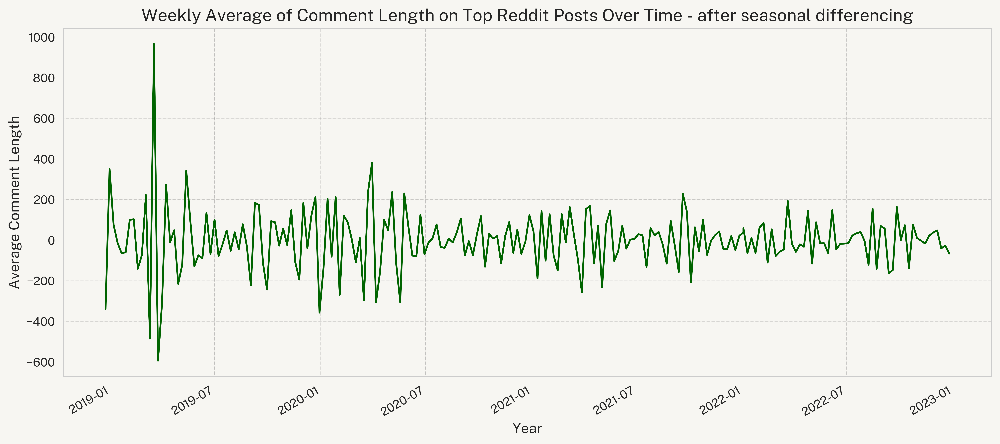

In [37]:
seasonal_diff = seasonal_diff.diff(52).dropna()

# plotting comment length over time, week by week
seasonal_diff.plot(color='darkgreen')
plt.title('Weekly Average of Comment Length on Top Reddit Posts Over Time - after seasonal differencing')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')

plt.show()

## Testing for stationarity

In [38]:
# ADF test for stationarity
from statsmodels.tsa.stattools import adfuller

result = adfuller(seasonal_diff)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -9.980692
p-value: 0.000000


Based on the above test statistic, the time series is likely stationary as it is, and requires no transformation or processing to make it stationary. We can also confirm this using the ACF and PACF.

### ACF and PACF plots

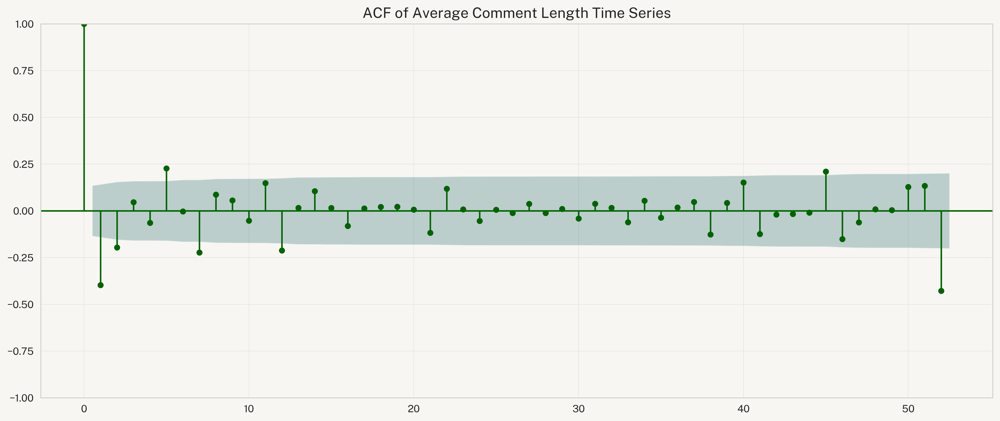

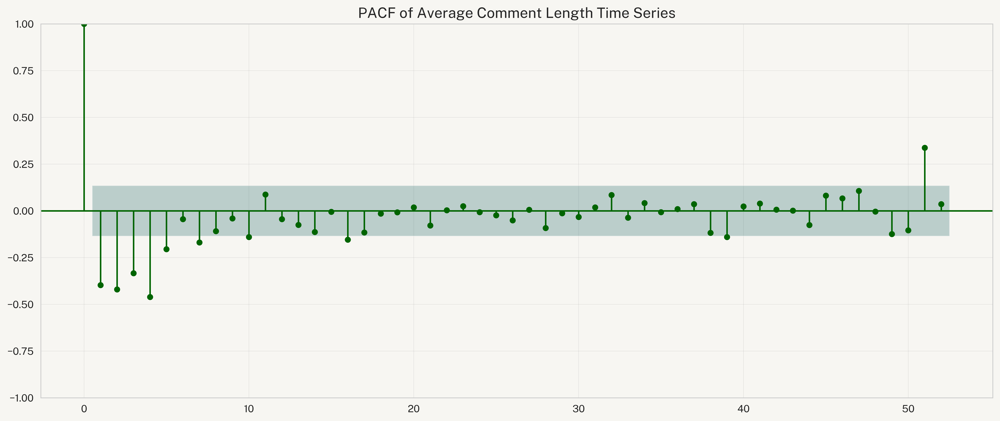

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(seasonal_diff,
        lags=52,
        color='darkgreen',
        vlines_kwargs={'color': 'darkgreen'},
        title='ACF of Average Comment Length Time Series')
plt.xlabel("Lag in Weeks")
plt.tight_layout()
plt.show()

plot_pacf(seasonal_diff,
    lags=52,
    color='darkgreen',
    vlines_kwargs={'color': 'darkgreen'},)
plt.title('PACF of Average Comment Length Time Series')
plt.xlabel("Lag in Weeks")
plt.tight_layout()
plt.show()

Looking at the ACF and PACF, we can use parameters (1, 1, 0) and (1, 2, 0, 52).

In [40]:
# splitting the time series into training and testing sets
train = weekly_time_series[weekly_time_series.index < '2021-12-31']
test = weekly_time_series[weekly_time_series.index >= '2022-01-01']

In [41]:
train.index = train.index.to_period('W')
test.index = test.index.to_period('W')

In [42]:
train.index.freq

<Week: weekday=6>

In [43]:
# Fitting a SARIMA model to the weekly time series

from statsmodels.tsa.statespace.sarimax import SARIMAX

model = SARIMAX(train['avg_comment_length'], order=(1, 1, 0), seasonal_order=(1, 2, 1, 52))
model_fit = model.fit()

c:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning: Non-invertible starting seasonal moving average Using zeros as starting parameters.
  warn('Non-invertible starting seasonal moving average'


In [44]:
test

,year,week,avg_comment_length,avg_comment_ttr,avg_comment_fkgl
date-time,,,,,
2022-01-03/2022-01-09,2021,53,276.400000,0.564111,10.271532
2022-01-03/2022-01-09,2022,1,286.797129,0.566291,11.386104
2022-01-10/2022-01-16,2022,2,250.207143,0.575536,9.716769
2022-01-17/2022-01-23,2022,3,295.533333,0.537571,9.383333
2022-01-24/2022-01-30,2022,4,252.647712,0.568716,10.262529
2022-01-31/2022-02-06,2022,5,256.719780,0.550910,23.404212
2022-02-07/2022-02-13,2022,6,236.879152,0.560432,10.408964
2022-02-14/2022-02-20,2022,7,244.728890,0.568205,10.475232
2022-02-21/2022-02-27,2022,8,232.396384,0.569863,9.454894


In [45]:
forecast = model_fit.forecast(steps=len(test))
forecast.index = test.index

In [46]:
# testing model performance
from sklearn.metrics import root_mean_squared_error

rmse = root_mean_squared_error(test['avg_comment_length'], forecast)

In [47]:
rmse

38.51350879471503

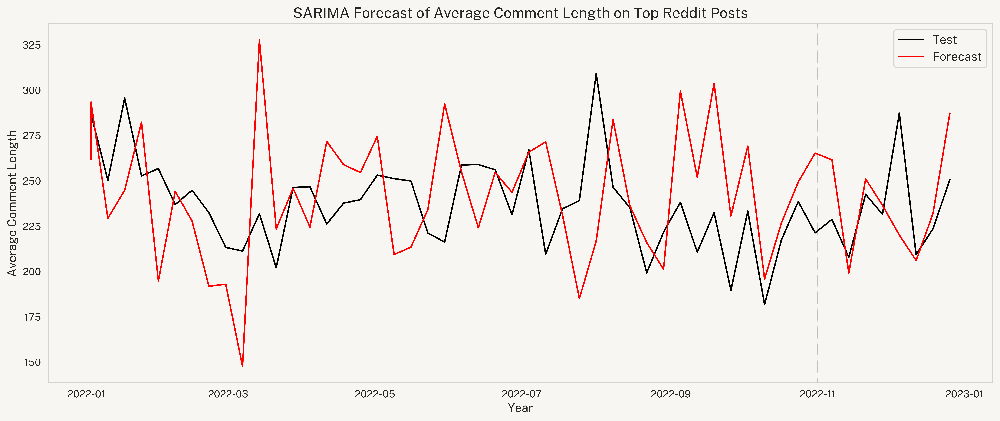

In [48]:
# convert Period index to datetime index for plotting
test.index = test.index.to_timestamp()
forecast.index = forecast.index.to_timestamp()

# plot test and forecasted values
plt.plot(test['avg_comment_length'], color='black')
plt.plot(forecast, color='red')
plt.title('SARIMA Forecast of Average Comment Length on Top Reddit Posts')
plt.xlabel('Year')
plt.ylabel('Average Comment Length')
plt.legend(['Test', 'Forecast'])
plt.tight_layout()
plt.show()

In [60]:
# Ljung box test
from statsmodels.stats.diagnostic import acorr_ljungbox

residuals = model_fit.resid

lb_test = acorr_ljungbox(residuals, lags=[52])
lb_test

,lb_stat,lb_pvalue
52,222.983617,4.775416e-23


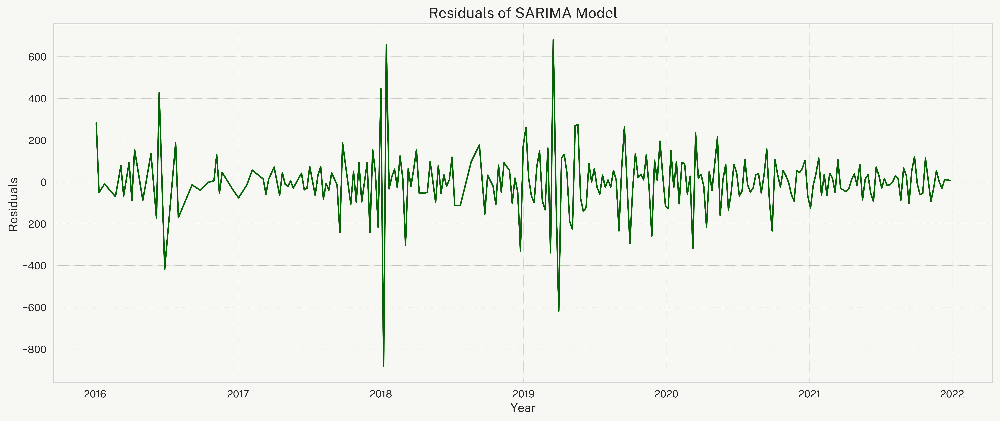

In [54]:

# plotting the residuals
residuals.index = residuals.index.to_timestamp()
plt.plot(residuals, color='darkgreen')
plt.title('Residuals of SARIMA Model')
plt.xlabel('Year')
plt.ylabel('Residuals')
plt.tight_layout()
plt.show()